In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import scipy.ndimage.filters as filters
import math
import pm

6.1

In [2]:
def find_max(image, size, threshold):
    """
    Znajduje lokalne maksima w obrazie, które są powyżej progu.
    image: obraz wejściowy (macierz H po normalizacji)
    size: rozmiar maski filtra maksymalnego (np. 7)
    threshold: próg, powyżej którego maksima są brane pod uwagę
    """
    data_max = filters.maximum_filter(image, size)
    maxima = (image == data_max)
    
    diff = image > threshold 
    
    maxima[diff == 0] = 0 # Zeruj maksima, które nie spełniają progu
    
    return np.nonzero(maxima)

In [3]:
def harris_detector(image_path, gaussian_kernel_size=5, sobel_kernel_size=3, harris_k=0.05):
    """
    Wykrywa narożniki na obrazie metodą Harrisa.
    image_path: ścieżka do obrazu
    gaussian_kernel_size: rozmiar maski filtra Gaussa do wygładzania iloczynów pochodnych
    sobel_kernel_size: rozmiar maski filtra Sobela
    harris_k: stała k we wzorze Harrisa
    Zwraca: obraz H z odpowiedzią Harrisa (znormalizowany), oryginalny obraz
    """
    img = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if img is None:
        print(f"Błąd: Nie można wczytać obrazu ze ścieżki: {image_path}")
        return None, None
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    gray = np.float32(gray)

    Ix = cv2.Sobel(gray, cv2.CV_32F, 1, 0, ksize=sobel_kernel_size)
    Iy = cv2.Sobel(gray, cv2.CV_32F, 0, 1, ksize=sobel_kernel_size)

    Ixx = Ix**2
    Iyy = Iy**2
    Ixy = Ix * Iy

    Sxx = cv2.GaussianBlur(Ixx, (gaussian_kernel_size, gaussian_kernel_size), 0)
    Syy = cv2.GaussianBlur(Iyy, (gaussian_kernel_size, gaussian_kernel_size), 0)
    Sxy = cv2.GaussianBlur(Ixy, (gaussian_kernel_size, gaussian_kernel_size), 0)

    det_M = Sxx * Syy - Sxy**2
    trace_M = Sxx + Syy
    H = det_M - harris_k * (trace_M**2)

    H_normalized = np.zeros_like(H, dtype=np.float32)
    cv2.normalize(H, H_normalized, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
    
    return H_normalized, img

In [4]:
def display_corners(original_image, corners_y, corners_x, title="Wykryte narożniki"):
    """
    Wyświetla oryginalny obraz z naniesionymi wykrytymi narożnikami.
    original_image: obraz, na którym rysujemy (najlepiej kolorowy dla kontrastu)
    corners_y: współrzędne y narożników
    corners_x: współrzędne x narożników
    title: tytuł wykresu
    """
    plt.figure(figsize=(10, 8))
    # Konwersja BGR (OpenCV) do RGB (Matplotlib)
    plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)) 
    plt.plot(corners_x, corners_y, 'r*', markersize=5) # czerwone gwiazdki
    plt.title(title)
    plt.axis('off') 
    plt.show()

Przetwarzanie obrazu: Fontanna 1 (fontanna1.jpg)
Wykryto 52 narożników dla obrazu Fontanna 1.


C:\Users\tmade\AppData\Local\Temp\ipykernel_20292\2071030267.py:8: DeprecationWarning: Please import `maximum_filter` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  data_max = filters.maximum_filter(image, size)


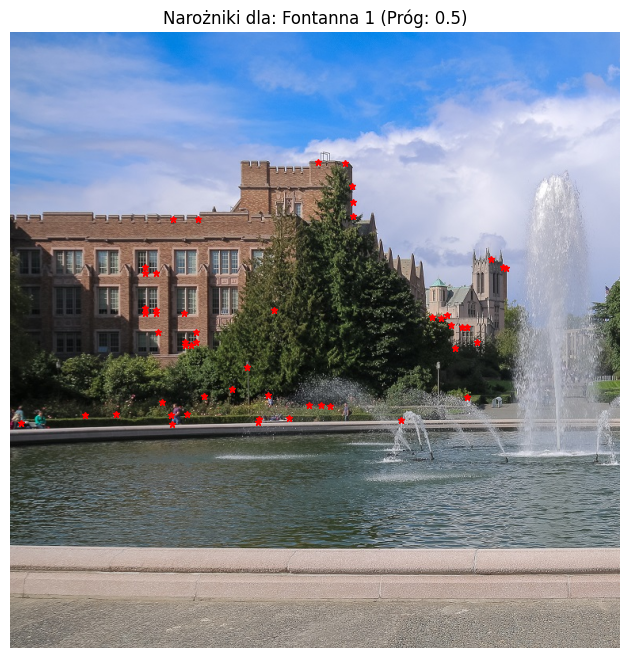

------------------------------
Przetwarzanie obrazu: Fontanna 2 (fontanna2.jpg)
Wykryto 120 narożników dla obrazu Fontanna 2.


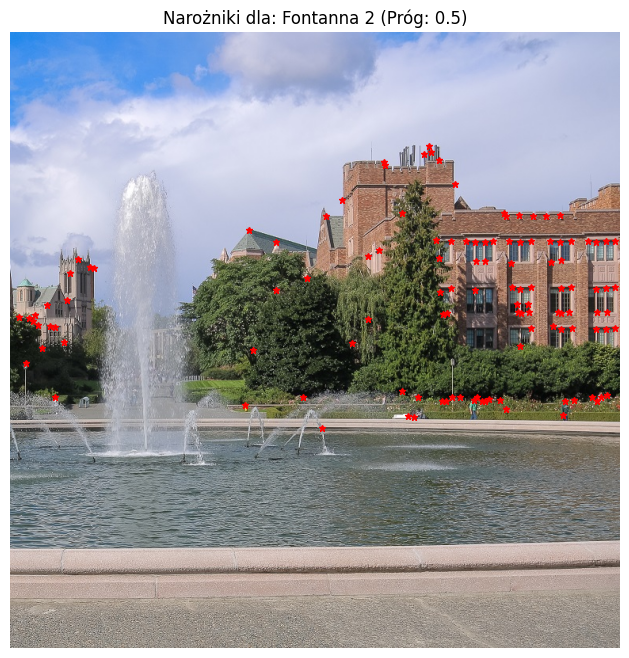

------------------------------
Przetwarzanie obrazu: Budynek 1 (budynek1.jpg)
Wykryto 391 narożników dla obrazu Budynek 1.


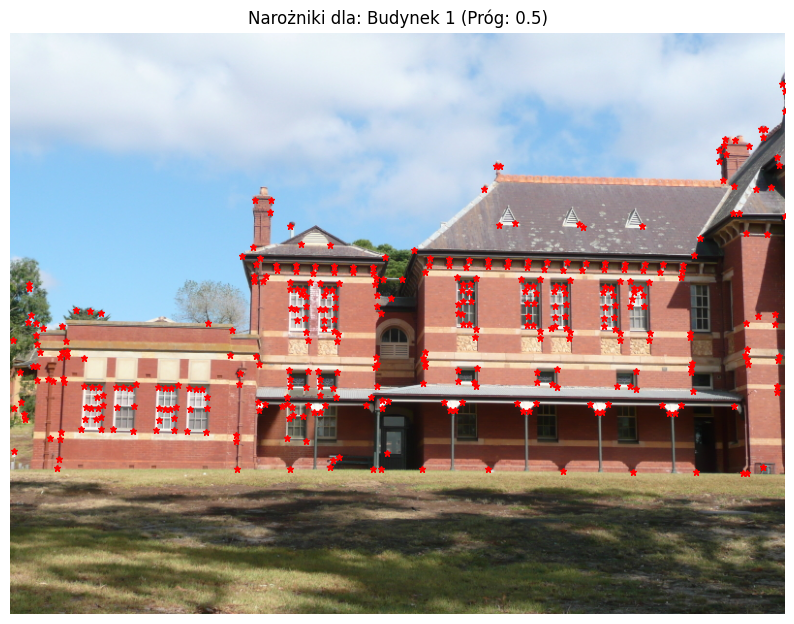

------------------------------
Przetwarzanie obrazu: Budynek 2 (budynek2.jpg)
Wykryto 113 narożników dla obrazu Budynek 2.


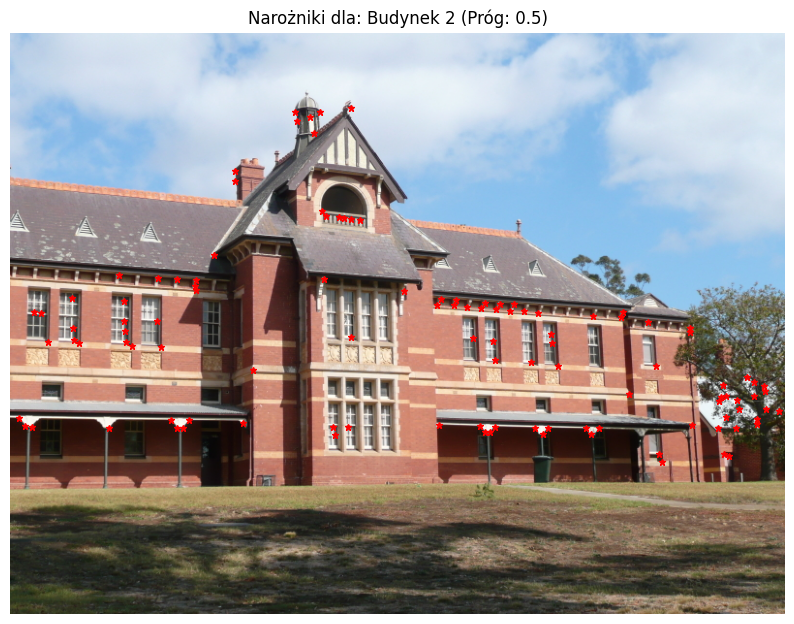

------------------------------


In [5]:
image_files = {
    "Fontanna 1": "fontanna1.jpg",
    "Fontanna 2": "fontanna2.jpg",
    "Budynek 1": "budynek1.jpg",
    "Budynek 2": "budynek2.jpg"
}

# Parametry wspólne
GAUSSIAN_KERNEL_SIZE = 5 
SOBEL_KERNEL_SIZE = 3    
HARRIS_K = 0.05          

# Parametry dla find_max
MAX_FILTER_SIZE = 7      
# Próg można dostosować interaktywnie w tej komórce
THRESHOLD = 0.5 # Zacznij od tej wartości, możesz ją zmieniać i ponownie uruchamiać komórkę

for name, path in image_files.items():
    print(f"Przetwarzanie obrazu: {name} ({path})")
    
    H_response_normalized, original_img_for_display = harris_detector(
        path,
        gaussian_kernel_size=GAUSSIAN_KERNEL_SIZE,
        sobel_kernel_size=SOBEL_KERNEL_SIZE,
        harris_k=HARRIS_K
    )
    
    if H_response_normalized is not None and original_img_for_display is not None:
        corners_y, corners_x = find_max(H_response_normalized, MAX_FILTER_SIZE, THRESHOLD)
        
        print(f"Wykryto {len(corners_x)} narożników dla obrazu {name}.")
        
        display_corners(original_img_for_display, corners_y, corners_x, title=f"Narożniki dla: {name} (Próg: {THRESHOLD})")
        
        # Opcjonalnie: Wyświetlenie samej odpowiedzi Harrisa
        # plt.figure(figsize=(10,8))
        # plt.imshow(H_response_normalized, cmap='gray')
        # plt.title(f"Odpowiedź Harrisa dla: {name}")
        # plt.colorbar()
        # plt.show()
    else:
        print(f"Nie udało się przetworzyć obrazu {name}.")
    print("-" * 30)

6.2

In [6]:
def create_descriptors(image_gray, corners_y, corners_x, patch_size=15):
    """
    Tworzy deskryptory dla podanych narożników jako wycinki obrazu.
    image_gray: obraz w skali szarości, na którym operujemy
    corners_y: współrzędne y narożników
    corners_x: współrzędne x narożników
    patch_size: rozmiar kwadratowego wycinka (np. 15x15)
    Zwraca: listę krotek ( (y,x)_punktu, deskryptor_wektorowy ),
             oraz listy odfiltrowanych współrzędnych y i x (te mogą nie być potrzebne, jeśli nie używamy)
    """
    descriptors = []
    # filtered_corners_y = [] # Możemy pominąć, jeśli nie używamy ich później bezpośrednio
    # filtered_corners_x = []
    
    if patch_size % 2 == 0:
        raise ValueError("Rozmiar wycinka (patch_size) musi być nieparzysty.")
    
    half_patch = patch_size // 2
    img_h, img_w = image_gray.shape

    for y, x in zip(corners_y, corners_x):
        # Sprawdzenie, czy wycinek mieści się w granicach obrazu
        if (y - half_patch >= 0 and y + half_patch < img_h and
            x - half_patch >= 0 and x + half_patch < img_w):
            
            patch = image_gray[y - half_patch : y + half_patch + 1, 
                               x - half_patch : x + half_patch + 1]
            
            descriptors.append(((y, x), patch.flatten())) 
            # filtered_corners_y.append(y)
            # filtered_corners_x.append(x)
            
    return descriptors #, np.array(filtered_corners_y), np.array(filtered_corners_x)

In [7]:
def match_descriptors(descriptors1, descriptors2, num_best_matches=20, metric='SAD'):
    """
    Porównuje deskryptory z dwóch obrazów i znajduje N najlepszych dopasowań.
    descriptors1: lista deskryptorów z pierwszego obrazu [ ((y,x), desc_vec), ... ]
    descriptors2: lista deskryptorów z drugiego obrazu [ ((y,x), desc_vec), ... ]
    num_best_matches: liczba najlepszych dopasowań do zwrócenia
    metric: metryka podobieństwa ('SAD' - Sum of Absolute Differences, 'SSD' - Sum of Squared Differences)
    Zwraca: listę najlepszych dopasowań, posortowaną wg. podobieństwa
            Każdy element listy to ( (y1,x1), (y2,x2), miara_podobienstwa )
    """
    matches = []

    for p1_coords, desc1 in descriptors1:
        best_match_p2_coords = None
        best_match_metric_val = float('inf') 

        for p2_coords, desc2 in descriptors2:
            if metric == 'SAD':
                metric_val = np.sum(np.abs(desc1 - desc2))
            elif metric == 'SSD':
                metric_val = np.sum((desc1 - desc2)**2)
            else:
                raise ValueError("Nieznana metryka. Użyj 'SAD' lub 'SSD'.")

            if metric_val < best_match_metric_val:
                best_match_metric_val = metric_val
                best_match_p2_coords = p2_coords
        
        if best_match_p2_coords is not None:
            matches.append((p1_coords, best_match_p2_coords, best_match_metric_val))

    matches.sort(key=lambda x: x[2])
    
    return matches[:num_best_matches]

Testowanie pary: Fontanny
  Znaleziono 52 narożników i 52 deskryptorów dla fontanna1.jpg
  Znaleziono 120 narożników i 117 deskryptorów dla fontanna2.jpg
  Znaleziono 20 najlepszych dopasowań.


C:\Users\tmade\AppData\Local\Temp\ipykernel_20292\2071030267.py:8: DeprecationWarning: Please import `maximum_filter` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  data_max = filters.maximum_filter(image, size)


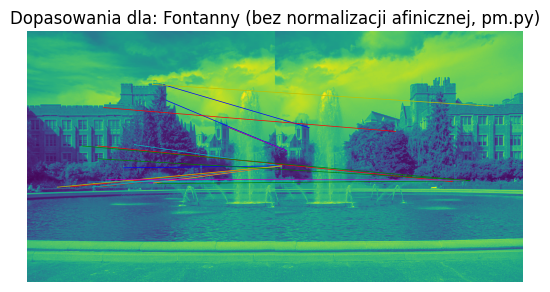

----------------------------------------
Testowanie pary: Budynki
  Znaleziono 391 narożników i 382 deskryptorów dla budynek1.jpg
  Znaleziono 113 narożników i 112 deskryptorów dla budynek2.jpg
  Znaleziono 20 najlepszych dopasowań.


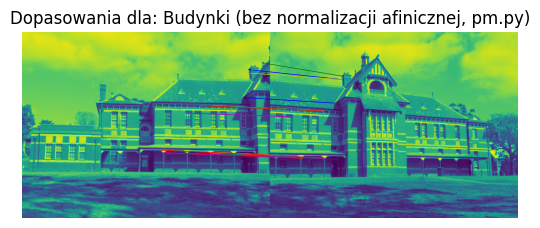

----------------------------------------
Testowanie pary: Fontanna vs Powiększona
  Znaleziono 52 narożników i 52 deskryptorów dla fontanna1.jpg
  Znaleziono 41 narożników i 41 deskryptorów dla fontanna_pow.jpg
  Znaleziono 20 najlepszych dopasowań.


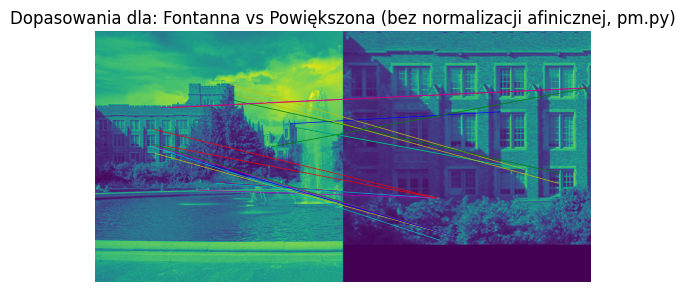

----------------------------------------
Testowanie pary: Eiffel
  Znaleziono 86 narożników i 85 deskryptorów dla eiffel1.jpg
  Znaleziono 208 narożników i 208 deskryptorów dla eiffel2.jpg
  Znaleziono 20 najlepszych dopasowań.


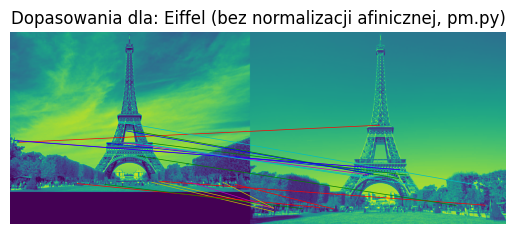

----------------------------------------


In [8]:
# Założenie: funkcje harris_detector i find_max są zdefiniowane w poprzednich komórkach (z Ćw. 6.1)

# Parametry z Ćwiczenia 6.1
GAUSSIAN_KERNEL_SIZE_HARRIS = 5 
SOBEL_KERNEL_SIZE_HARRIS = 3    
HARRIS_K_HARRIS = 0.05          
MAX_FILTER_SIZE_HARRIS = 7      
THRESHOLD_HARRIS = 0.5 # Dostosuj ten próg wg potrzeb

# Parametry dla deskryptorów i dopasowań
PATCH_SIZE = 15 
NUM_BEST_MATCHES = 20 
METRIC_TYPE = 'SAD' 

image_pairs_to_test = {
    "Fontanny": ("fontanna1.jpg", "fontanna2.jpg"),
    "Budynki": ("budynek1.jpg", "budynek2.jpg"),
    "Fontanna vs Powiększona": ("fontanna1.jpg", "fontanna_pow.jpg"),
    "Eiffel": ("eiffel1.jpg", "eiffel2.jpg")
}

for pair_name, (path1, path2) in image_pairs_to_test.items():
    print(f"Testowanie pary: {pair_name}")

    # Obraz 1
    H_norm1, img1_orig_color = harris_detector(path1, GAUSSIAN_KERNEL_SIZE_HARRIS, SOBEL_KERNEL_SIZE_HARRIS, HARRIS_K_HARRIS)
    if img1_orig_color is None: continue
    img1_gray = cv2.cvtColor(img1_orig_color, cv2.COLOR_BGR2GRAY)
    corners_y1, corners_x1 = find_max(H_norm1, MAX_FILTER_SIZE_HARRIS, THRESHOLD_HARRIS)
    descriptors1 = create_descriptors(img1_gray, corners_y1, corners_x1, PATCH_SIZE)
    print(f"  Znaleziono {len(corners_x1)} narożników i {len(descriptors1)} deskryptorów dla {path1}")

    # Obraz 2
    H_norm2, img2_orig_color = harris_detector(path2, GAUSSIAN_KERNEL_SIZE_HARRIS, SOBEL_KERNEL_SIZE_HARRIS, HARRIS_K_HARRIS)
    if img2_orig_color is None: continue
    img2_gray = cv2.cvtColor(img2_orig_color, cv2.COLOR_BGR2GRAY)
    corners_y2, corners_x2 = find_max(H_norm2, MAX_FILTER_SIZE_HARRIS, THRESHOLD_HARRIS)
    descriptors2 = create_descriptors(img2_gray, corners_y2, corners_x2, PATCH_SIZE)
    print(f"  Znaleziono {len(corners_x2)} narożników i {len(descriptors2)} deskryptorów dla {path2}")

    if descriptors1 and descriptors2:
        best_matches = match_descriptors(descriptors1, descriptors2, NUM_BEST_MATCHES, METRIC_TYPE)
        print(f"  Znaleziono {len(best_matches)} najlepszych dopasowań.")

        # Przygotowanie danych do pm.plot_matches
        # Funkcja pm.plot_matches oczekuje obrazów i listy dopasowań.
        # Upewnijmy się, że przekazujemy obrazy w skali szarości,
        # ponieważ Twoja funkcja pm.plot_matches nie konwertuje BGR->RGB ani nie używa cmap.
        # Jeśli chcesz wyświetlać obrazy kolorowe, musisz zmodyfikować pm.plot_matches
        # lub przekonwertować je do RGB przed wywołaniem.
        
        # Przekazanie obrazów w skali szarości do pm.plot_matches
        matches_for_pm = []
        for (p1_coords, p2_coords, metric_val) in best_matches:
            # Format dla pm.plot_matches to lista krotek, gdzie każda krotka to
            # ((y1,x1), (y2,x2)) - pomijamy miarę, jeśli funkcja jej nie używa,
            # lub ((y1,x1), (y2,x2), miara) jeśli jednak jest potrzebna (twoja funkcja jej nie używa w pętli)
            # Z PDF: format to [((y1,x1),(y2,x2)), ... ]
            # Nasza funkcja match_descriptors zwraca ((y1,x1), (y2,x2), miara)
            # więc musimy dostosować lub upewnić się, że pm.plot_matches to obsłuży.
            # Twoja funkcja pm.plot_matches oczekuje m[0] jako (y1,x1) i m[1] jako (y2,x2)
            matches_for_pm.append((p1_coords, p2_coords)) # Usuwamy miarę, jeśli pm.plot_matches jej nie potrzebuje

        # Jeśli obrazy są oryginalnie kolorowe, a pm.plot_matches ma wyświetlać kolory:
        #pm.plot_matches(img1_orig_color, img2_orig_color, matches_for_pm)
        # Jeśli pm.plot_matches jest dla skali szarości, użyj imgX_gray:
        pm.plot_matches(img1_gray, img2_gray, matches_for_pm) 
        plt.title(f"Dopasowania dla: {pair_name} (bez normalizacji afinicznej, pm.py)") # Dodajemy tytuł po wywołaniu pm
        plt.show() # Upewnij się, że wykres jest pokazany
    else:
        print(f"  Nie znaleziono wystarczającej liczby deskryptorów do dopasowania dla pary {pair_name}.")
    print("-" * 40)

In [9]:
def create_descriptors_affine_normalized(image_gray, corners_y, corners_x, patch_size=15):
    """
    Tworzy deskryptory dla podanych narożników jako wycinki obrazu,
    z uwzględnieniem normalizacji afinicznej (wzór 6.9).
    """
    descriptors = []
    
    if patch_size % 2 == 0:
        raise ValueError("Rozmiar wycinka (patch_size) musi być nieparzysty.")
    
    half_patch = patch_size // 2
    img_h, img_w = image_gray.shape

    for y, x in zip(corners_y, corners_x):
        if (y - half_patch >= 0 and y + half_patch < img_h and
            x - half_patch >= 0 and x + half_patch < img_w):
            
            patch_raw = image_gray[y - half_patch : y + half_patch + 1, 
                                   x - half_patch : x + half_patch + 1]
            
            w = patch_raw.flatten().astype(np.float32)
            w_bar = np.mean(w)
            
            # Zgodnie z PDF, |w-w_bar| to odchylenie standardowe
            std_w = np.std(w) 
            
            if std_w > 1e-6: 
                w_aff = (w - w_bar) / std_w
            else:
                w_aff = np.zeros_like(w)
            
            descriptors.append(((y, x), w_aff))
            
    return descriptors

Testowanie pary (z normalizacją afiniczną): Fontanny
  Znaleziono 52 deskryptorów (afin.) dla fontanna1.jpg
  Znaleziono 117 deskryptorów (afin.) dla fontanna2.jpg
  Znaleziono 20 najlepszych dopasowań (afin.).


C:\Users\tmade\AppData\Local\Temp\ipykernel_20292\2071030267.py:8: DeprecationWarning: Please import `maximum_filter` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  data_max = filters.maximum_filter(image, size)


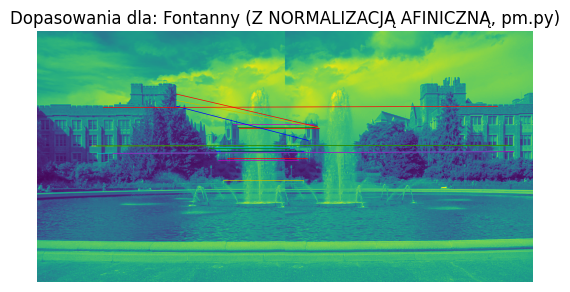

----------------------------------------
Testowanie pary (z normalizacją afiniczną): Budynki
  Znaleziono 382 deskryptorów (afin.) dla budynek1.jpg
  Znaleziono 112 deskryptorów (afin.) dla budynek2.jpg
  Znaleziono 20 najlepszych dopasowań (afin.).


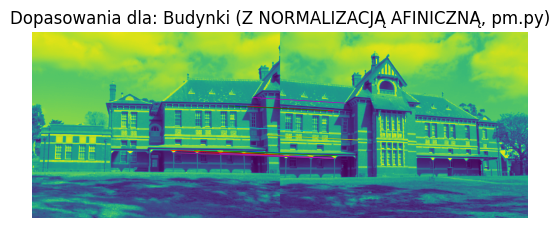

----------------------------------------
Testowanie pary (z normalizacją afiniczną): Fontanna vs Powiększona
  Znaleziono 52 deskryptorów (afin.) dla fontanna1.jpg
  Znaleziono 41 deskryptorów (afin.) dla fontanna_pow.jpg
  Znaleziono 20 najlepszych dopasowań (afin.).


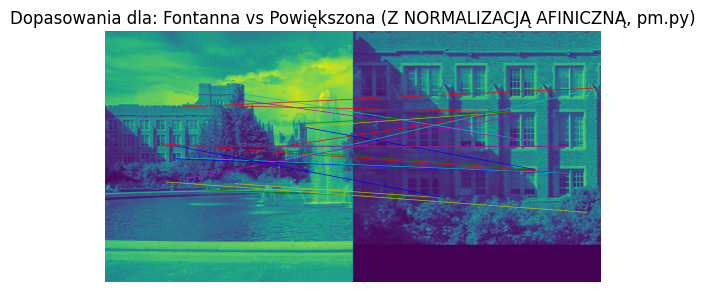

----------------------------------------
Testowanie pary (z normalizacją afiniczną): Eiffel
  Znaleziono 85 deskryptorów (afin.) dla eiffel1.jpg
  Znaleziono 208 deskryptorów (afin.) dla eiffel2.jpg
  Znaleziono 20 najlepszych dopasowań (afin.).


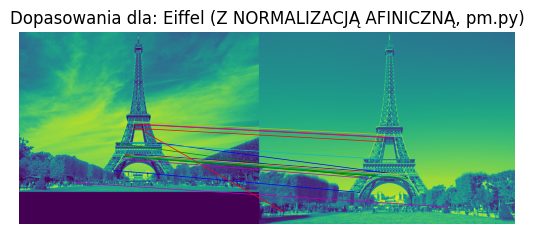

----------------------------------------


In [10]:
# Użyj tych samych parametrów i par obrazów co w Komórce 4

for pair_name, (path1, path2) in image_pairs_to_test.items():
    print(f"Testowanie pary (z normalizacją afiniczną): {pair_name}")

    # Obraz 1
    H_norm1, img1_orig_color = harris_detector(path1, GAUSSIAN_KERNEL_SIZE_HARRIS, SOBEL_KERNEL_SIZE_HARRIS, HARRIS_K_HARRIS)
    if img1_orig_color is None: continue
    img1_gray = cv2.cvtColor(img1_orig_color, cv2.COLOR_BGR2GRAY)
    corners_y1, corners_x1 = find_max(H_norm1, MAX_FILTER_SIZE_HARRIS, THRESHOLD_HARRIS)
    descriptors1_aff = create_descriptors_affine_normalized(img1_gray, corners_y1, corners_x1, PATCH_SIZE)
    print(f"  Znaleziono {len(descriptors1_aff)} deskryptorów (afin.) dla {path1}")

    # Obraz 2
    H_norm2, img2_orig_color = harris_detector(path2, GAUSSIAN_KERNEL_SIZE_HARRIS, SOBEL_KERNEL_SIZE_HARRIS, HARRIS_K_HARRIS)
    if img2_orig_color is None: continue
    img2_gray = cv2.cvtColor(img2_orig_color, cv2.COLOR_BGR2GRAY)
    corners_y2, corners_x2 = find_max(H_norm2, MAX_FILTER_SIZE_HARRIS, THRESHOLD_HARRIS)
    descriptors2_aff = create_descriptors_affine_normalized(img2_gray, corners_y2, corners_x2, PATCH_SIZE)
    print(f"  Znaleziono {len(descriptors2_aff)} deskryptorów (afin.) dla {path2}")

    if descriptors1_aff and descriptors2_aff:
        best_matches_aff = match_descriptors(descriptors1_aff, descriptors2_aff, NUM_BEST_MATCHES, METRIC_TYPE)
        print(f"  Znaleziono {len(best_matches_aff)} najlepszych dopasowań (afin.).")
        
        matches_for_pm_aff = []
        for (p1_coords, p2_coords, metric_val) in best_matches_aff:
            matches_for_pm_aff.append((p1_coords, p2_coords))

        # Użyj pm.plot_matches, przekazując obrazy w skali szarości
        pm.plot_matches(img1_gray, img2_gray, matches_for_pm_aff)
        plt.title(f"Dopasowania dla: {pair_name} (Z NORMALIZACJĄ AFINICZNĄ, pm.py)")
        plt.show()
    else:
        print(f"  Nie znaleziono wystarczającej liczby deskryptorów (afin.) do dopasowania dla pary {pair_name}.")
    print("-" * 40)

6.3

In [11]:
def fast_detector(gray_image, threshold=20, n_star=9, nonmax_suppression=True, harris_score_threshold_factor=0.01):
    """
    Wykrywa punkty kluczowe metodą FAST.
    gray_image: obraz w skali szarości (uint8)
    threshold: próg intensywności dla testu FAST
    n_star: minimalna liczba sąsiadujących pikseli spełniających warunek (zwykle 9, 11 lub 12)
    nonmax_suppression: czy zastosować non-maximum suppression na punktach FAST (OpenCV robi to domyślnie)
    harris_score_threshold_factor: mnożnik maksymalnego score Harrisa do odfiltrowania słabych punktów FAST
    Zwraca: listę obiektów cv2.KeyPoint
    """
    # OpenCV ma wbudowany detektor FAST, który jest wydajny.
    # Dla celów dydaktycznych, implementacja od zera byłaby bardzo długa.
    # Skupimy się na krokach ORB, używając komponentów OpenCV tam, gdzie to praktyczne.
    
    # Krok 1: Użyj wbudowanego detektora FAST z OpenCV
    # Argumenty: threshold, nonmaxSuppression, type (TYPE_9_16 jest powszechne)
    fast = cv2.FastFeatureDetector_create(threshold=threshold, 
                                          nonmaxSuppression=nonmax_suppression,
                                          type=cv2.FAST_FEATURE_DETECTOR_TYPE_9_16) # lub TYPE_7_12, TYPE_5_8
    keypoints_fast = fast.detect(gray_image, None)

    if not keypoints_fast:
        return []

    # Krok 2 & 3 z PDF (Sortowanie wg. miary Harrisa i NMS)
    # OpenCV FAST z nonmaxSuppression=True już wykonuje pewien rodzaj NMS.
    # Dodatkowo, ORB sortuje punkty wg. miary Harrisa.
    
    # Oblicz miarę Harrisa dla każdego punktu FAST
    # Musimy dostosować, aby obliczyć miarę Harrisa tylko w lokalizacjach keypoints_fast
    # Można użyć funkcji harris_detector z Ćw 6.1, ale potrzebujemy odpowiedzi H
    # dla całego obrazu, a potem odczytać wartości dla keypoints.
    
    # Użyjemy uproszczonego podejścia: Obliczamy score Harrisa dla wszystkich punktów FAST
    # (OpenCV KeyPoint ma pole 'response' które można by tu wykorzystać, ale FAST nie ustawia go jako Harris score)
    
    # Modyfikacja: Obliczamy miarę Harrisa dla całego obrazu, a potem filtrujemy
    # lub, prościej dla tego etapu, używamy response z FAST, który jest miarą "FAST-owości"
    # ORB w rzeczywistości używa Harris corner measure do scoringu punktów FAST.
    
    # Dla uproszczenia i skupienia na BRIEF, na razie pominiemy ręczne liczenie Harrisa dla każdego punktu FAST
    # i założymy, że 'response' z FAST jest wystarczającą miarą do sortowania,
    # lub po prostu bierzemy wszystkie punkty FAST po NMS. W pełnym ORB jest to ważny krok.
    
    # Wg. PDF: "Posortuj otrzymane punkty według miary Harrisa. Wybierz N najlepszych punktów."
    # To sugeruje, że powinniśmy obliczyć miarę Harrisa.
    
    # Obliczmy miarę Harrisa dla całego obrazu
    # (Można by zoptymalizować, ale dla jasności kodu)
    H_response_full, _ = harris_detector(image_input=gray_image.astype(np.float32), # Wymaga float32
                                         gaussian_kernel_size=3, # Mniejsze okno dla lokalnej miary
                                         sobel_kernel_size=3,
                                         harris_k=0.04) # Typowe k dla Harrisa

    kp_with_harris_score = []
    for kp in keypoints_fast:
        x, y = int(kp.pt[0]), int(kp.pt[1])
        if 0 <= y < H_response_full.shape[0] and 0 <= x < H_response_full.shape[1]:
            kp.response = H_response_full[y, x] # Ustawiamy 'response' jako miarę Harrisa
            kp_with_harris_score.append(kp)
            
    # Sortuj punkty według miary Harrisa (malejąco)
    kp_with_harris_score.sort(key=lambda kp: kp.response, reverse=True)
    
    # Możemy wybrać N najlepszych, np. 500, jak w ORB
    # num_features_to_keep = 500 
    # selected_keypoints = kp_with_harris_score[:num_features_to_keep]
    
    # Na razie zwracamy wszystkie posortowane, dalsze filtrowanie w kolejnych krokach ORB
    return kp_with_harris_score


# Modyfikacja funkcji harris_detector, aby mogła przyjąć obraz jako wejście
def harris_detector(image_path=None, image_input=None, gaussian_kernel_size=5, sobel_kernel_size=3, harris_k=0.05):
    if image_input is None:
        if image_path is None:
            raise ValueError("Należy podać ścieżkę do obrazu lub obraz jako macierz numpy.")
        img = cv2.imread(image_path)
        if img is None:
            print(f"Błąd: Nie można wczytać obrazu ze ścieżki: {image_path}")
            return None, None
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        gray_float = np.float32(gray)
    else:
        if len(image_input.shape) == 3: # Jeśli obraz kolorowy
             gray = cv2.cvtColor(image_input, cv2.COLOR_BGR2GRAY)
        else: # Zakładamy, że już jest w skali szarości
             gray = image_input
        gray_float = np.float32(gray) # Upewnij się, że jest float
        img = image_input # Do zwrócenia, jeśli było kolorowe

    Ix = cv2.Sobel(gray_float, cv2.CV_32F, 1, 0, ksize=sobel_kernel_size)
    Iy = cv2.Sobel(gray_float, cv2.CV_32F, 0, 1, ksize=sobel_kernel_size)
    Ixx = Ix**2; Iyy = Iy**2; Ixy = Ix * Iy
    Sxx = cv2.GaussianBlur(Ixx, (gaussian_kernel_size, gaussian_kernel_size), 0)
    Syy = cv2.GaussianBlur(Iyy, (gaussian_kernel_size, gaussian_kernel_size), 0)
    Sxy = cv2.GaussianBlur(Ixy, (gaussian_kernel_size, gaussian_kernel_size), 0)
    det_M = Sxx * Syy - Sxy**2
    trace_M = Sxx + Syy
    H = det_M - harris_k * (trace_M**2)
    H_normalized = np.zeros_like(H, dtype=np.float32)
    cv2.normalize(H, H_normalized, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
    return H_normalized, img # Zwracamy oryginalny obraz, jeśli był wczytany, lub wejściowy

In [12]:
def calculate_moment(image_patch, p, q):
    """Oblicza moment mpq dla danego wycinka obrazu."""
    moment = 0.0
    # Zakładamy, że środek wycinka (0,0) jest w jego centrum
    # Przeskalujmy współrzędne, aby (0,0) było w centrum
    center_x = image_patch.shape[1] // 2
    center_y = image_patch.shape[0] // 2
    for r_idx in range(image_patch.shape[0]):
        for c_idx in range(image_patch.shape[1]):
            x = c_idx - center_x
            y = r_idx - center_y
            pixel_value = float(image_patch[r_idx, c_idx])
            moment += (x**p) * (y**q) * pixel_value
    return moment

def calculate_orientation(gray_image, keypoints, patch_radius=15):
    """
    Oblicza orientację dla każdego punktu kluczowego używając centroidu jasności.
    Aktualizuje pole 'angle' w obiektach KeyPoint (w stopniach).
    patch_radius: promień wycinka wokół punktu kluczowego.
    """
    oriented_keypoints = []
    for kp in keypoints:
        x, y = int(kp.pt[0]), int(kp.pt[1])
        
        # Wycięcie patcha (upewnij się, że nie wychodzi poza obraz)
        # Rozmiar patcha = 2*patch_radius + 1
        min_r = max(0, y - patch_radius)
        max_r = min(gray_image.shape[0], y + patch_radius + 1)
        min_c = max(0, x - patch_radius)
        max_c = min(gray_image.shape[1], x + patch_radius + 1)
        
        patch = gray_image[min_r:max_r, min_c:max_c]

        if patch.size == 0: # Pusty patch, np. punkt na krawędzi
            kp.angle = 0.0 # Domyślna orientacja
            oriented_keypoints.append(kp)
            continue

        # Oblicz momenty m10 i m01 (wzór 6.10)
        m10 = calculate_moment(patch, 1, 0)
        m01 = calculate_moment(patch, 0, 1)
        # m00 = calculate_moment(patch, 0, 0) # Jeśli potrzebny do centroidu C (wzór 6.11)
                                           # ale dla kąta wystarczą m10 i m01
        
        # Oblicz orientację (wzór 6.12)
        angle_rad = math.atan2(m01, m10)
        angle_deg = math.degrees(angle_rad) # OpenCV KeyPoint.angle jest w stopniach
        
        kp.angle = angle_deg # Ustaw orientację dla KeyPoint
        oriented_keypoints.append(kp)
        
    return oriented_keypoints

In [13]:
# Wczytanie par punktów dla BRIEF (lub wygenerowanie losowych)
# Załóżmy, że plik 'orb_descriptor_positions.txt' jest dostępny
# i ma format: x1 y1 x2 y2 (po jednej parze w linii)
try:
    brief_pairs = np.loadtxt('orb_descriptor_positions.txt', dtype=np.int32).reshape(-1, 2, 2)
    # brief_pairs będzie miało kształt (256, 2, 2), gdzie brief_pairs[i] = [[x1,y1], [x2,y2]]
    # Współrzędne są względem środka patcha 31x31
    print(f"Wczytano {brief_pairs.shape[0]} par punktów dla BRIEF.")
except IOError:
    print("Nie znaleziono pliku 'orb_descriptor_positions.txt'. Generowanie losowych par dla BRIEF.")
    # Generowanie losowych par (uproszczenie, pełny ORB używa bardziej zaawansowanej metody)
    # W obrębie patcha 31x31, więc współrzędne od -15 do 15
    patch_size_brief = 31
    half_brief = patch_size_brief // 2
    num_pairs = 256
    brief_pairs = np.random.randint(-half_brief, half_brief + 1, size=(num_pairs, 2, 2))

def create_brief_descriptor(gray_image_blurred, keypoint, brief_pairs_orig, patch_size_brief=31):
    """
    Tworzy 256-bitowy deskryptor BRIEF dla danego punktu kluczowego.
    gray_image_blurred: obraz w skali szarości, wygładzony Gaussa (np. 5x5)
    keypoint: obiekt cv2.KeyPoint z obliczoną orientacją (kp.angle w stopniach)
    brief_pairs_orig: oryginalne pary punktów (N, 2, 2) przed rotacją
    patch_size_brief: rozmiar wycinka dla BRIEF (domyślnie 31x31)
    Zwraca: 32-bajtowy (256-bitowy) deskryptor jako np.array(dtype=np.uint8)
    """
    descriptor = np.zeros(32, dtype=np.uint8) # 32 bajty * 8 bitów = 256 bitów
    half_brief = patch_size_brief // 2
    
    center_x, center_y = int(keypoint.pt[0]), int(keypoint.pt[1])
    angle_rad = math.radians(keypoint.angle) # Kąt z KeyPoint
    cos_a = math.cos(angle_rad)
    sin_a = math.sin(angle_rad)

    for i in range(brief_pairs_orig.shape[0]): # Dla każdej z 256 par
        p1_orig = brief_pairs_orig[i, 0] # [x1_orig, y1_orig]
        p2_orig = brief_pairs_orig[i, 1] # [x2_orig, y2_orig]

        # Rotacja pary punktów (wzory 6.14, 6.15)
        # x' = x*cos(a) - y*sin(a)
        # y' = x*sin(a) + y*cos(a)
        
        x1_rot = int(round(p1_orig[0] * cos_a - p1_orig[1] * sin_a))
        y1_rot = int(round(p1_orig[0] * sin_a + p1_orig[1] * cos_a))
        
        x2_rot = int(round(p2_orig[0] * cos_a - p2_orig[1] * sin_a))
        y2_rot = int(round(p2_orig[0] * sin_a + p2_orig[1] * cos_a))

        # Współrzędne absolutne na obrazie
        abs_x1, abs_y1 = center_x + x1_rot, center_y + y1_rot
        abs_x2, abs_y2 = center_x + x2_rot, center_y + y2_rot

        # Test binarny (wzór 6.13)
        # Sprawdzenie granic obrazu
        val1, val2 = 0, 0 # Domyślne wartości, jeśli poza obrazem
        if (0 <= abs_y1 < gray_image_blurred.shape[0] and 0 <= abs_x1 < gray_image_blurred.shape[1]):
            val1 = gray_image_blurred[abs_y1, abs_x1]
        
        if (0 <= abs_y2 < gray_image_blurred.shape[0] and 0 <= abs_x2 < gray_image_blurred.shape[1]):
            val2 = gray_image_blurred[abs_y2, abs_x2]
            
        test_result = 1 if val1 < val2 else 0
        
        # Zapisz bit do deskryptora
        # i // 8 daje indeks bajtu, i % 8 daje pozycję bitu w bajcie
        if test_result == 1:
            descriptor[i // 8] |= (1 << (i % 8))
            
    return descriptor

Wczytano 256 par punktów dla BRIEF.


C:\Users\tmade\AppData\Local\Temp\ipykernel_20292\1189720867.py:5: DeprecationWarning: loadtxt(): Parsing an integer via a float is deprecated.  To avoid this warning, you can:
    * make sure the original data is stored as integers.
    * use the `converters=` keyword argument.  If you only use
      NumPy 1.23 or later, `converters=float` will normally work.
    * Use `np.loadtxt(...).astype(np.int64)` parsing the file as
      floating point and then convert it.  (On all NumPy versions.)
  (Deprecated NumPy 1.23)
  brief_pairs = np.loadtxt('orb_descriptor_positions.txt', dtype=np.int32).reshape(-1, 2, 2)


In [14]:
def match_brief_descriptors(descriptors1, keypoints1, descriptors2, keypoints2, num_best_matches=20):
    """
    Dopasowuje deskryptory BRIEF używając odległości Hamminga.
    descriptors1: lista deskryptorów (np.array uint8) dla obrazu 1
    keypoints1: lista KeyPoint dla obrazu 1 (do odniesienia)
    descriptors2: lista deskryptorów dla obrazu 2
    keypoints2: lista KeyPoint dla obrazu 2
    num_best_matches: liczba najlepszych dopasowań do zwrócenia
    Zwraca: listę krotek ((y1,x1), (y2,x2), odleglosc_hamminga)
    """
    # OpenCV BFMatcher z cv2.NORM_HAMMING robi to efektywnie.
    # Dla celów dydaktycznych, zaimplementujmy ręcznie.
    
    matches = []
    if not descriptors1 or not descriptors2:
        return []

    for i, desc1 in enumerate(descriptors1):
        best_match_idx_j = -1
        min_hamming_dist = 257 # Max możliwa odległość + 1 (dla 256 bitów)

        for j, desc2 in enumerate(descriptors2):
            # Oblicz odległość Hamminga (liczba różniących się bitów)
            # np.bitwise_xor(desc1, desc2) da bajty z ustawionymi bitami tam, gdzie są różnice
            # np.unpackbits zamieni bajty na bity (0/1), potem można zsumować
            xor_result = np.bitwise_xor(desc1, desc2)
            # hamming_dist = np.sum(np.unpackbits(xor_result)) # To jest poprawne i proste
            
            # Alternatywnie, szybsze, używając tabeli przeglądowej lub wbudowanej funkcji, jeśli dostępna
            # OpenCV używa popcount instrukcji procesora, co jest bardzo szybkie.
            # Dla numpy można zrobić to tak:
            hamming_dist = 0
            for byte_idx in range(len(xor_result)):
                 hamming_dist += bin(xor_result[byte_idx]).count('1')


            if hamming_dist < min_hamming_dist:
                min_hamming_dist = hamming_dist
                best_match_idx_j = j
        
        if best_match_idx_j != -1:
            p1_coords = (int(keypoints1[i].pt[1]), int(keypoints1[i].pt[0])) # (y,x)
            p2_coords = (int(keypoints2[best_match_idx_j].pt[1]), int(keypoints2[best_match_idx_j].pt[0])) # (y,x)
            matches.append((p1_coords, p2_coords, min_hamming_dist))

    matches.sort(key=lambda x: x[2]) # Sortuj wg. odległości Hamminga (rosnąco)
    return matches[:num_best_matches]

Testowanie ORB dla pary: Fontanny ORB
  fontanna1.jpg: 3168 punktów FAST po filtracji.
  fontanna2.jpg: 4098 punktów FAST po filtracji.
  Znaleziono 30 dopasowań ORB.


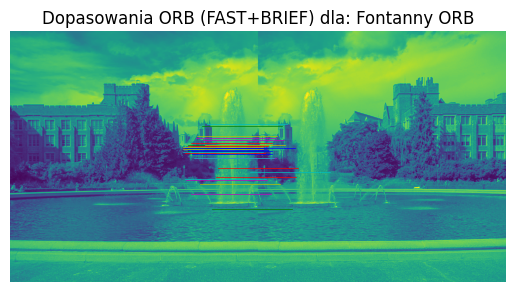

----------------------------------------
Testowanie ORB dla pary: Eiffel ORB
  eiffel1.jpg: 2538 punktów FAST po filtracji.
  eiffel2.jpg: 2965 punktów FAST po filtracji.
  Znaleziono 30 dopasowań ORB.


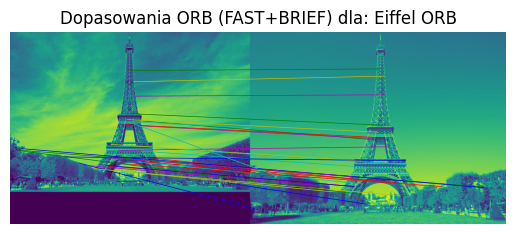

----------------------------------------


In [15]:
# Parametry
FAST_THRESHOLD = 50
N_STAR_FAST = 9 # dla TYPE_9_16
ORIENT_PATCH_RADIUS = 15 # promień dla obliczania orientacji
BRIEF_PATCH_SIZE = 31 # Rozmiar wycinka dla BRIEF (musi być nieparzysty)
GAUSS_BLUR_SIZE_FOR_BRIEF = (5,5) # Rozmycie przed BRIEF
NUM_ORB_MATCHES = 30 # Liczba najlepszych dopasowań ORB

# Obrazy testowe (te same co wcześniej, lub inne jeśli chcesz)
orb_image_paths = {
    "Fontanny ORB": ("fontanna1.jpg", "fontanna2.jpg"),
    "Eiffel ORB": ("eiffel1.jpg", "eiffel2.jpg")
    # Możesz dodać więcej par, np. te z obrotem
}

for pair_name, (path1, path2) in orb_image_paths.items():
    print(f"Testowanie ORB dla pary: {pair_name}")

    img1_color = cv2.imread(path1)
    img2_color = cv2.imread(path2)
    if img1_color is None or img2_color is None:
        print("  Nie udało się wczytać jednego z obrazów.")
        continue
        
    img1_gray = cv2.cvtColor(img1_color, cv2.COLOR_BGR2GRAY)
    img2_gray = cv2.cvtColor(img2_color, cv2.COLOR_BGR2GRAY)

    # Krok 1: Detekcja FAST i selekcja z Harrisem
    kp1_fast_sorted = fast_detector(img1_gray, threshold=FAST_THRESHOLD, n_star=N_STAR_FAST)
    kp2_fast_sorted = fast_detector(img2_gray, threshold=FAST_THRESHOLD, n_star=N_STAR_FAST)
    
    # (Opcjonalnie) Usuń punkty zbyt blisko krawędzi dla BRIEF patcha
    # (filtrowanie po rozmiarze patcha BRIEF)
    def filter_kp_for_patch(kps, img_shape, patch_radius):
        h, w = img_shape
        return [kp for kp in kps if 
                patch_radius <= kp.pt[0] < w - patch_radius and 
                patch_radius <= kp.pt[1] < h - patch_radius]

    kp1_filtered = filter_kp_for_patch(kp1_fast_sorted, img1_gray.shape, BRIEF_PATCH_SIZE // 2)
    kp2_filtered = filter_kp_for_patch(kp2_fast_sorted, img2_gray.shape, BRIEF_PATCH_SIZE // 2)

    print(f"  {path1}: {len(kp1_filtered)} punktów FAST po filtracji.")
    print(f"  {path2}: {len(kp2_filtered)} punktów FAST po filtracji.")

    if not kp1_filtered or not kp2_filtered:
        print("  Za mało punktów po detekcji FAST.")
        continue

    # Krok 2: Obliczanie orientacji
    kp1_oriented = calculate_orientation(img1_gray, kp1_filtered, patch_radius=ORIENT_PATCH_RADIUS)
    kp2_oriented = calculate_orientation(img2_gray, kp2_filtered, patch_radius=ORIENT_PATCH_RADIUS)

    # Krok 3: Tworzenie deskryptorów BRIEF
    # Obraz musi być rozmyty przed ekstrakcją BRIEF
    img1_blurred = cv2.GaussianBlur(img1_gray, GAUSS_BLUR_SIZE_FOR_BRIEF, 0)
    img2_blurred = cv2.GaussianBlur(img2_gray, GAUSS_BLUR_SIZE_FOR_BRIEF, 0)
    
    descriptors1_brief = [create_brief_descriptor(img1_blurred, kp, brief_pairs, BRIEF_PATCH_SIZE) for kp in kp1_oriented]
    descriptors2_brief = [create_brief_descriptor(img2_blurred, kp, brief_pairs, BRIEF_PATCH_SIZE) for kp in kp2_oriented]

    # Krok 4: Dopasowywanie deskryptorów BRIEF
    orb_matches = match_brief_descriptors(descriptors1_brief, kp1_oriented, 
                                          descriptors2_brief, kp2_oriented, 
                                          num_best_matches=NUM_ORB_MATCHES)
    
    print(f"  Znaleziono {len(orb_matches)} dopasowań ORB.")

    # Wizualizacja (używając Twojego pm.plot_matches)
    if orb_matches:
        matches_for_pm_orb = []
        for (p1_coords, p2_coords, hamming_dist) in orb_matches:
            matches_for_pm_orb.append((p1_coords, p2_coords)) # pm.plot_matches nie potrzebuje dystansu

        # Użyj obrazów w skali szarości dla pm.plot_matches, jeśli tak jest skonfigurowane
        pm.plot_matches(img1_gray, img2_gray, matches_for_pm_orb)
        plt.title(f"Dopasowania ORB (FAST+BRIEF) dla: {pair_name}")
        plt.show()
    
    print("-" * 40)

6.4

In [ ]:
def create_panorama(img_path1, img_path2, detector_name="SIFT", match_ratio_thresh=0.75):
    """
    Tworzy panoramę z dwóch obrazów używając detektora/deskryptora z OpenCV.
    img_path1: ścieżka do lewego obrazu
    img_path2: ścieżka do prawego obrazu
    detector_name: nazwa detektora do użycia ("SIFT", "ORB", "SURF" - SURF może wymagać contrib)
    match_ratio_thresh: próg dla testu Lowe's ratio (dla SIFT/SURF)
    Zwraca: połączony obraz panoramy lub None w przypadku błędu.
    """
    img1_color = cv2.imread(img_path1)
    img2_color = cv2.imread(img_path2)

    if img1_color is None or img2_color is None:
        print(f"Błąd: Nie można wczytać obrazu: {img_path1} lub {img_path2}")
        return None

    img1_gray = cv2.cvtColor(img1_color, cv2.COLOR_BGR2GRAY)
    img2_gray = cv2.cvtColor(img2_color, cv2.COLOR_BGR2GRAY)

    # Krok 2: Wybierz i utwórz detektor/deskryptor
    if detector_name == "SIFT":
        detector = cv2.SIFT_create()
        norm_type = cv2.NORM_L2 # Dla SIFT/SURF
    elif detector_name == "ORB":
        detector = cv2.ORB_create(nfeatures=2000) # Można zwiększyć liczbę cech
        norm_type = cv2.NORM_HAMMING # Dla ORB/BRIEF
    elif detector_name == "SURF": # SURF może wymagać opencv-contrib-python
        try:
            detector = cv2.xfeatures2d.SURF_create(400) # Próg Hessian
            norm_type = cv2.NORM_L2
        except AttributeError:
            print("Detektor SURF nie jest dostępny. Zainstaluj opencv-contrib-python lub wybierz inny detektor.")
            return None
    else:
        print(f"Nieznany detektor: {detector_name}")
        return None

    # Wykryj punkty kluczowe i oblicz deskryptory
    kp1, des1 = detector.detectAndCompute(img1_gray, None)
    kp2, des2 = detector.detectAndCompute(img2_gray, None)

    if des1 is None or des2 is None or len(kp1) < 2 or len(kp2) < 2: # Potrzebujemy co najmniej 2 punktów do homografii
        print("Nie znaleziono wystarczającej liczby deskryptorów/punktów kluczowych.")
        return None
        
    print(f"Wykryto {len(kp1)} punktów w obrazie 1 i {len(kp2)} punktów w obrazie 2 używając {detector_name}.")

    # Krok 4 & 5: Dopasowywanie punktów
    # Użyj BFMatcher (Brute-Force Matcher)
    bf = cv2.BFMatcher(norm_type)
    
    # Znajdź k-najbliższych sąsiadów (k=2, aby zastosować ratio test)
    matches_knn = bf.knnMatch(des1, des2, k=2)

    # Krok 6: Zastosuj test Lowe's ratio (szczególnie dla SIFT/SURF)
    good_matches = []
    if matches_knn and len(matches_knn[0]) == 2: # Upewnij się, że knnMatch zwrócił pary
        for m, n in matches_knn:
            if m.distance < match_ratio_thresh * n.distance:
                good_matches.append(m) # Zapisujemy tylko pierwszy (lepszy) obiekt DMatch
    elif detector_name == "ORB": # Dla ORB często wystarczy proste dopasowanie bez ratio testu lub inny próg
        # Dla ORB, można użyć prostego bf.match i sortowania po dystansie
        matches_orb = bf.match(des1, des2)
        matches_orb = sorted(matches_orb, key=lambda x: x.distance)
        good_matches = matches_orb[:int(len(matches_orb) * 0.15)] # np. 15% najlepszych
        print(f"Wybrano {len(good_matches)} najlepszych dopasowań dla ORB (po sortowaniu).")


    print(f"Liczba 'dobrych' dopasowań po ratio teście (lub selekcji dla ORB): {len(good_matches)}")

    # Krok 7: (Opcjonalnie) Wyświetl dopasowania
    img_matches = cv2.drawMatches(img1_color, kp1, img2_color, kp2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.figure(figsize=(20,10))
    plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))
    plt.title(f"Dopasowania dla {detector_name}")
    plt.show()

    # Krok 8: Wyznacz macierz homografii, jeśli jest wystarczająco dużo dopasowań
    MIN_MATCH_COUNT = 10 # Minimalna liczba dopasowań do obliczenia homografii
    if len(good_matches) > MIN_MATCH_COUNT:
        # Wydobądź lokalizacje dopasowanych punktów kluczowych
        src_pts = np.float32([ kp1[m.queryIdx].pt for m in good_matches ]).reshape(-1,1,2)
        dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good_matches ]).reshape(-1,1,2)

        # Oblicz macierz homografii H
        # RANSAC pomaga odfiltrować błędne dopasowania (outliers)
        H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0) 
                                    # 5.0 to próg reprojekcji dla RANSAC

        if H is None:
            print("Nie udało się obliczyć homografii.")
            return None

        # Krok 9: Zastosuj transformację perspektywiczną (warpPerspective)
        # Rozmiar wynikowego obrazu: szerokość obu obrazów, wysokość maksymalna
        h1, w1 = img1_color.shape[:2]
        h2, w2 = img2_color.shape[:2]
        
        # Połącz obraz 1 (lewy) z transformowanym obrazem 2 (prawym)
        # Transformujemy obraz 2, aby dopasować go do perspektywy obrazu 1
        # Dlatego src_pts to punkty z img1, a dst_pts to punkty z img2
        # Chcemy jednak nałożyć img1 na przetransformowany img2, więc odwracamy
        # Albo: transformujemy img1 na płaszczyznę img2.
        # PDF: "result [0: image_right.shape [0] , 0: image_right.shape [1]] = image_right"
        # Sugeruje to, że transformujemy lewy obraz, a prawy jest "bazą".
        
        # Wymiary panoramy
        panorama_width = w1 + w2
        panorama_height = max(h1, h2) # Proste założenie, można by obliczyć dokładniej
        
        # Transformuj lewy obraz tak, aby pasował do perspektywy prawego
        # (to jest bardziej typowe, jeśli prawy obraz jest "referencyjny")
        H_inv, _ = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, 5.0) # Odwrotna homografia
        result = cv2.warpPerspective(img1_color, H_inv, (panorama_width, panorama_height))
        result[0:h2, 0:w2] = img2_color # Nałóż prawy obraz na lewy górny róg
        
        # Alternatywnie (jak w PDF): transformujemy lewy obraz i łączymy z prawym
        # Przesunięcie prawego obrazu
        H_translate_right = np.array([[1, 0, w1], [0, 1, 0], [0, 0, 1]], dtype=np.float32)
        H_final = H_translate_right @ H # Najpierw warp, potem przesuń
        
        # Prostsze podejście:
        # Przekształć obraz lewy (img1) na płaszczyznę obrazu prawego (img2)
        # wynik będzie miał rozmiar prawego obrazu + szerokość lewego po lewej stronie
        # Wymiary: Szerokość obrazu prawego + Szerokość obrazu lewego
        #          Wysokość max(wys_lewy, wys_prawy)
        
        # Najpierw przygotuj płótno dla panoramy
        # Umieść prawy obraz po prawej stronie
        # Przekształć lewy obraz i umieść go tak, aby pasował do prawego
        
        # Metoda z PDF sugeruje transformację lewego obrazu i "doklejenie" prawego.
        # Wymiary panoramy: (szerokość lewego + szerokość prawego, max_wysokość)
        # Jednak bardziej intuicyjne jest przekształcenie jednego obrazu na płaszczyznę drugiego
        # i rozszerzenie płótna.
        
        # Spróbujmy standardowego podejścia: transformujemy img1 na płaszczyznę img2
        # i rozszerzamy płótno.
        
        # Homografia H transformuje punkty z img1 do układu img2.
        # Chcemy, aby img2 był po lewej, a img1 transformowany i doklejony po prawej.
        # Więc potrzebujemy H_img2_to_img1.
        H, mask = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, 5.0) # Odwracamy src i dst
        # Teraz H transformuje img2 do img1
        # warpujemy img2
        result = cv2.warpPerspective(img2_color, H, (w1 + w2, h1))
        result[0:h1, 0:w1] = img1_color # img1 jest po lewej
        
        # Podejście z PDF:
        # H transformuje src_pts (z img1) do dst_pts (na img2)
        # Chcemy nałożyć img1 na img2.
        # Przygotuj płótno o szerokości img1 + img2
        # Umieść img2 na płótnie, np. od (w1, 0)
        # Przekształć img1 i nałóż.
        
        # Prostsza metoda z wieloma tutorialami:
        # Przekształcamy obraz 2, aby dopasować go do obrazu 1
        # Homografia H mapuje punkty z obrazu 1 do obrazu 2.
        # Aby nałożyć obraz 2 na obraz 1, potrzebujemy homografii, która mapuje obraz 2 na płaszczyznę obrazu 1.
        H_2to1, mask_2to1 = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, 5.0)
        
        # Rozmiar panoramy: szerokość obu, wysokość maksymalna
        # Tworzymy obraz wynikowy o szerokości img1.width + img2.width
        # i maksymalnej wysokości
        
        # Transformuj obraz 2 (prawy) na płaszczyznę obrazu 1 (lewego)
        # H transformuje punkty z img1 (src_pts) do układu img2 (dst_pts)
        # Aby nałożyć img2 na img1, potrzebujemy transformacji z img2 do img1.
        # Zatem: src to punkty z img2, dst to punkty z img1.
        
        H_img2_to_img1, mask_img2_to_img1 = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC,5.0)
        
        # Szerokość i wysokość panoramy
        width_panorama = img1_color.shape[1] + img2_color.shape[1]
        height_panorama = max(img1_color.shape[0], img2_color.shape[0])
        
        # Przekształć obraz prawy (img2)
        img2_warped = cv2.warpPerspective(img2_color, H_img2_to_img1, (width_panorama, height_panorama))
        
        # Nałóż obraz lewy (img1) na lewą część przetransformowanego obrazu
        # Upewnij się, że nie nadpisujesz części, która powinna być z img2_warped
        # Prościej: skopiuj img1 na lewą stronę, a img2_warped na prawą, ale z overlapem
        
        # Najprostsze złożenie:
        # Umieść img1 po lewej.
        # Przekształć img2 tak, by pasował do img1 i nałóż.
        panorama = cv2.warpPerspective(img2_color, H_img2_to_img1, (img1_color.shape[1] + img2_color.shape[1], img1_color.shape[0]))
        # Skopiuj img1 do lewej części panoramy
        panorama[0:img1_color.shape[0], 0:img1_color.shape[1]] = img1_color
        
        # Krok 11: (Opcjonalnie) Usuń czarne tło
        # Prosta metoda: znajdź kontury nie-czarnych obszarów i przytnij
        # Dla uproszczenia, na razie pominiemy ten krok w kodzie,
        # ale można to zrobić analizując, gdzie kończą się nie-czarne piksele.
        # np. przez znalezienie bounding boxa dla nie-czarnych pikseli.
        gray_pano = cv2.cvtColor(panorama, cv2.COLOR_BGR2GRAY)
        _, thresh_pano = cv2.threshold(gray_pano, 1, 255, cv2.THRESH_BINARY)
        contours, _ = cv2.findContours(thresh_pano, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        
        if contours:
            # Znajdź największy kontur (powinien być obszarem panoramy)
            # lub połącz wszystkie kontury, aby uzyskać bounding box
            all_points = np.concatenate([cnt for cnt in contours])
            x, y, w, h = cv2.boundingRect(all_points)
            panorama_cropped = panorama[y:y+h, x:x+w]
            return panorama_cropped
        else:
            return panorama # Zwróć nieprzyciętą, jeśli nie ma konturów

    else:
        print(f"Niewystarczająca liczba dobrych dopasowań ({len(good_matches)}/{MIN_MATCH_COUNT}) do stworzenia panoramy.")
        return None

Detektor SURF nie jest dostępny. Zainstaluj opencv-contrib-python lub wybierz inny detektor.
Nie udało się utworzyć panoramy.

Testowanie z detektorem ORB:
Wykryto 2000 punktów w obrazie 1 i 2000 punktów w obrazie 2 używając ORB.
Liczba 'dobrych' dopasowań po ratio teście (lub selekcji dla ORB): 704


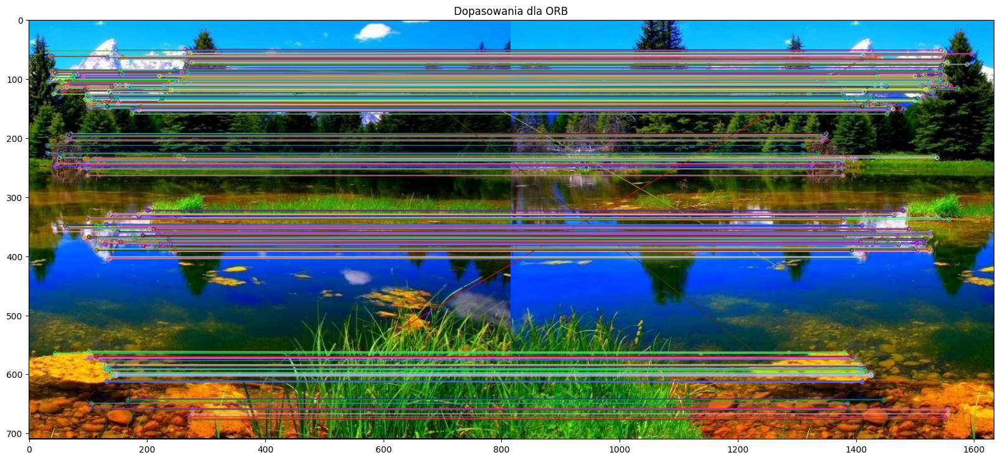

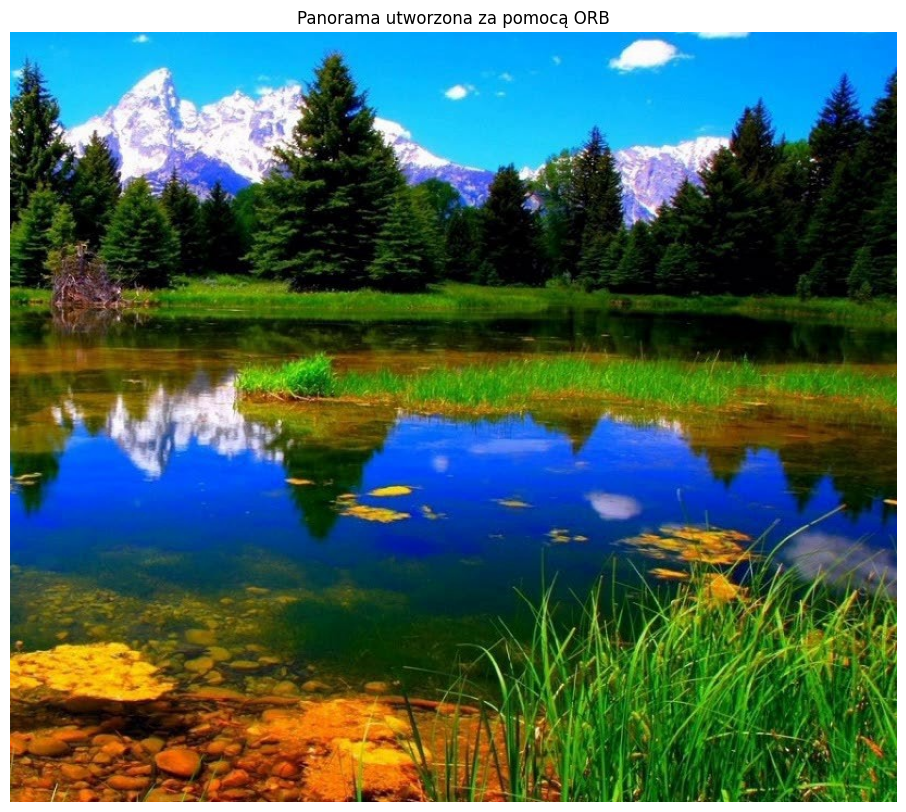

In [ ]:
# Ścieżki do obrazów panoramy
left_image_path = 'left_panorama.jpg'
right_image_path = 'right_panorama.jpg'

# Wybierz detektor: "SIFT", "ORB", "SURF"
# Pamiętaj, że SURF może wymagać opencv-contrib-python
selected_detector = "SIFT" 
# selected_detector = "ORB"

panorama_image = create_panorama(left_image_path, right_image_path, detector_name=selected_detector)

if panorama_image is not None:
    plt.figure(figsize=(15, 10))
    plt.imshow(cv2.cvtColor(panorama_image, cv2.COLOR_BGR2RGB))
    plt.title(f"Panorama utworzona za pomocą {selected_detector}")
    plt.axis('off')
    plt.show()
else:
    print("Nie udało się utworzyć panoramy.")

# Spróbuj z innym detektorem, np. ORB, jeśli masz problemy z SIFT/SURF lub dla porównania
if selected_detector != "ORB": # Unikaj ponownego testowania tego samego
    print("\nTestowanie z detektorem ORB:")
    panorama_image_orb = create_panorama(left_image_path, right_image_path, detector_name="ORB")
    if panorama_image_orb is not None:
        plt.figure(figsize=(15, 10))
        plt.imshow(cv2.cvtColor(panorama_image_orb, cv2.COLOR_BGR2RGB))
        plt.title("Panorama utworzona za pomocą ORB")
        plt.axis('off')
        plt.show()
    else:
        print("Nie udało się utworzyć panoramy za pomocą ORB.")